## Content
----
### [Arithemetic Operations](#arithemetic_operations)
- [X] Add, Subtract Two images (Image difference, Template Matching)

### [Geometric Transformations](#Geometric_Transformations)
- [X] Rotation, Crop

### [Color Image Transformation](#color_transform)
- [X] RGB → BGR → HSV
    - Play HSV with slider
    - Color the gray scale Image
- [X] Resizing (Downscale And Upscale[Interpolation] Image)
    
### [Image Enhancing](#image_enhancing)
- [X] Gray Scale Transform
    - Negative
    - Log Transform, Gamma Correction
    
### [Image Gradient](#image_gradient)
- [X] Gray Scale, Smooth image, Edge Detection Image (Sobel, Laplaican)

### [Image Segmentation](#image_segmentation)
- [X] Image Thresholding
    - difference between 0-1 and 0-255

### [Morphological Transforms](#morphological)
- [X] Erosion, Dilation
- [X] Opening, Closing, Hit Or Miss


<a id='arithemetic_operations'></a>
### Arithemetic Operations

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

def imShow(imgs, titles=None):
    num = len(imgs)
    x = (num//4)+1
    y = int(np.ceil(num/x))
    plt.figure(figsize=(18,15))
    for i in range(num):
        plt.subplot(x, y, i+1)
        cmap=None
        title=None
        if imgs[i].ndim==2:cmap='gray'
        if titles!=None:title=titles[i]
        plt.imshow(imgs[i], cmap=cmap)
        plt.title(title, fontdict={'fontsize':30})
    plt.tight_layout()
    plt.show()

#### Sub Two Images

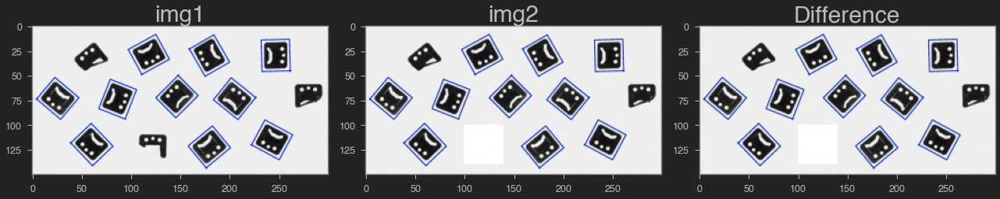

In [2]:
img1 = mpimg.imread('1.jpg')
img2 = mpimg.imread('2.jpg')

# First let's check their dimension
assert img1.shape == img2.shape

# Extend range so there won't be gibberish
# diff = img2 - img1
diff = img2.astype(np.int16) - img1.astype(np.int16)
diff[diff<0] = 0
imShow([img1, img2, diff], ['img1', 'img2', 'Difference'])

#### Add Two Images

Before resize :  (478, 717, 3) (421, 748, 3)
After resize :  (421, 748, 3) (421, 748, 3)


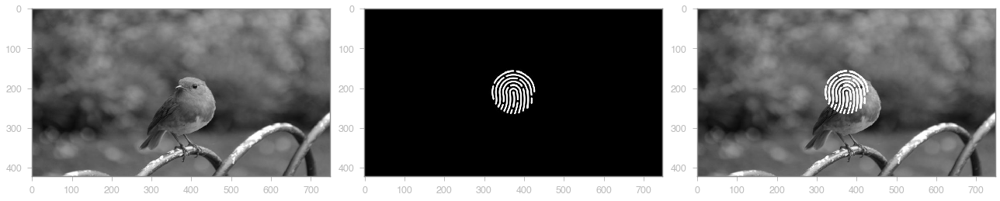

In [3]:
img1 = mpimg.imread('bird.jpg')
img2 = mpimg.imread('back.jpg')
h, w, d = img2.shape

print(f'Before resize : ', img1.shape, img2.shape)
img1 = cv2.resize(img1, (w, h))
print(f'After resize : ', img1.shape, img2.shape)

add = img2.astype(np.int16) + img1.astype(np.int16)
add[add>255] = 255
imShow([img1, img2, add])

#### Note:
While Adding, subtracting two different images, Be aware that their dimension (ie. img.shape) must be the same.

<a id='Geometric_Transformations'></a>
### [Geometric Transformations](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_geometric_transformations/py_geometric_transformations.html)
#### Rotation, Crop



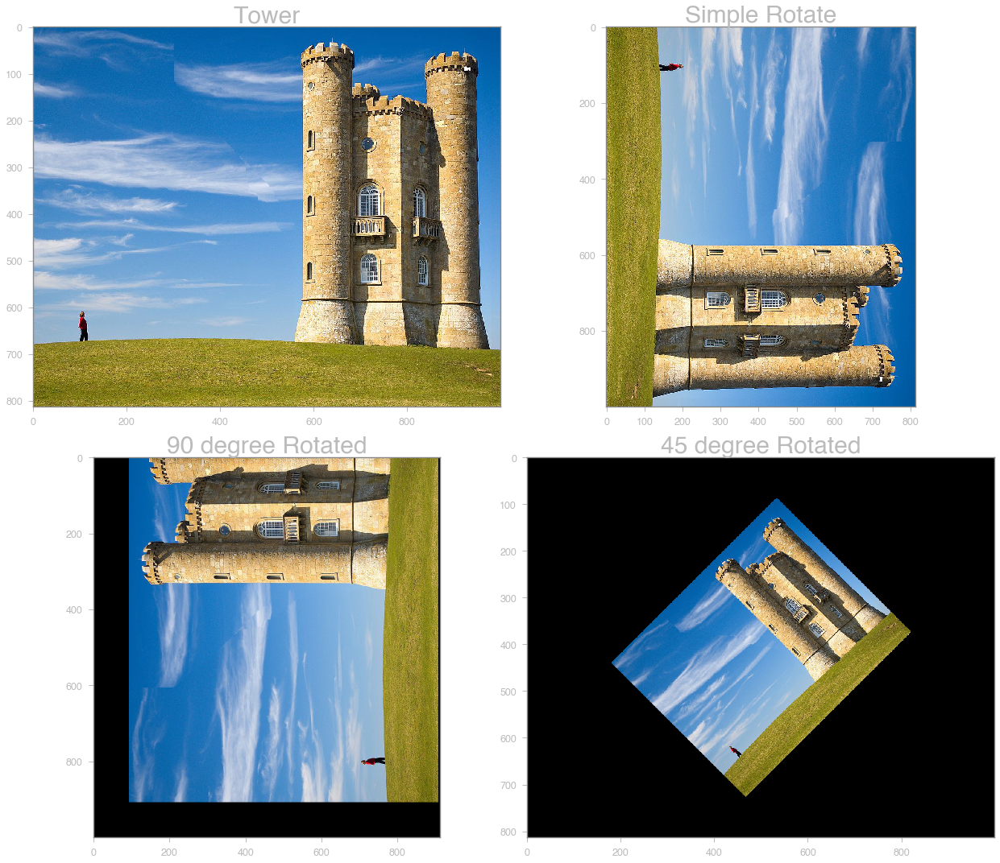

In [4]:
# Rotation
img = mpimg.imread('tower.jpg')
h, w, d = img.shape

simple = cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE)

# More Flexible This Way
M = cv2.getRotationMatrix2D((w/2, h/2), 90, 1)
rotated = cv2.warpAffine(img, M, (h+100, w))

M = cv2.getRotationMatrix2D((w//2, h//2), 45, 0.5)
rotated_ = cv2.warpAffine(img, M, (w, h))

imShow([img, simple, rotated, rotated_], ['Tower', 'Simple Rotate', '90 degree Rotated', '45 degree Rotated'])

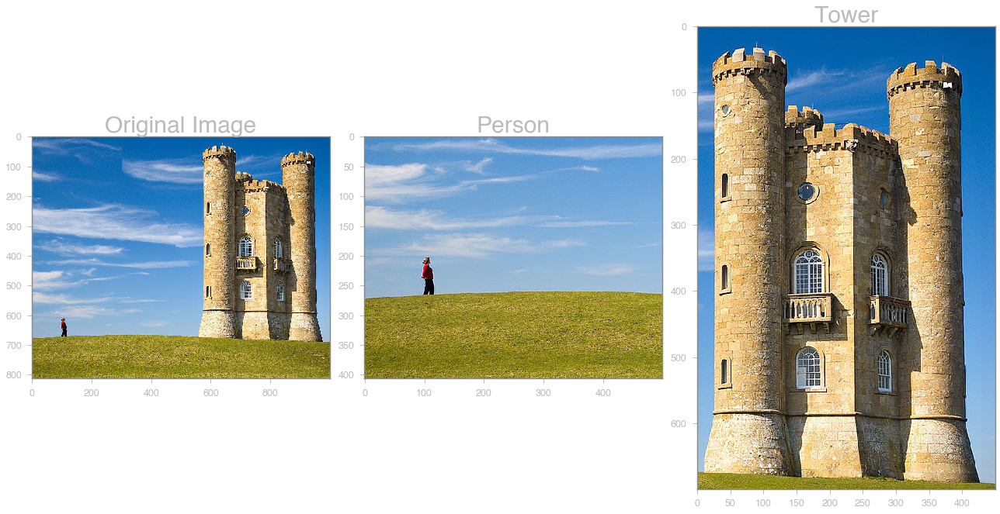

In [21]:
# Crop [Image Slicing]
img_copy = np.copy(img)
h, w, d = img_copy.shape
cropped = img_copy[h//2:, :w//2, :]
tower = img_copy[:700, 550:, :]
imShow([img, cropped, tower], ['Original Image', 'Person', 'Tower'])

<a id='color_transform'></a>
### Color Image Transformation

#### RGB -> BGR -> HSV
- [X] Play with slider
- [X] Grayscale to Heatmap

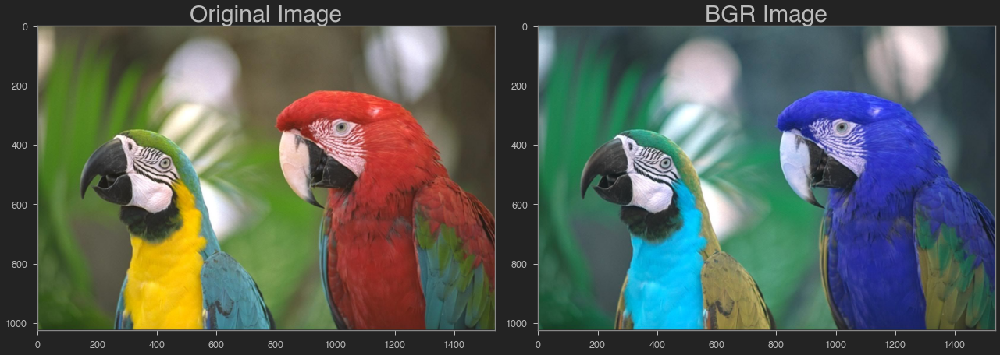

In [3]:
img = mpimg.imread('parrot.jpg')
bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
imShow([img, bgr], ['Original Image', 'BGR Image'])

In [4]:
from ipywidgets import interact, widgets, Layout, interactive

def addHue(hue):
    img = mpimg.imread('parrot.jpg')
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hsv = hsv.astype(np.int16)

    # Change here
    h = hsv[:, :, 0];s = hsv[:, :, 1];v = hsv[:, :, 2]
    h *= 2
    h += hue
    h[h>358] -= 359; h[h<0] += 359
    h = h/2
    hsv = np.dstack((h, s, v)).astype(np.uint8)
    revered = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    print(f"The amount added to the original hue is : {hue}")
    imShow([img, revered], ['Original Image', 'Hue Get Played Image'])
    
    
hue = widgets.IntSlider(min=-180, max=180, step=10, value=0, continuous_update=False ,layout=Layout(width='60%', height='20px'))
interactive(addHue, hue=hue)

interactive(children=(IntSlider(value=0, continuous_update=False, description='hue', layout=Layout(height='20p…

hue		 0 179 
saturation	 0 255 
value		 0 255


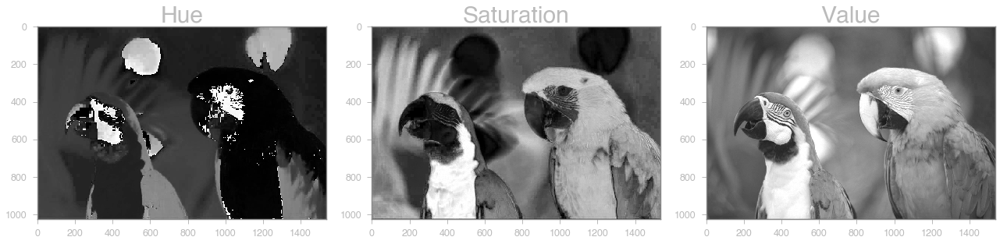

In [7]:
img = mpimg.imread('parrot.jpg')
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
h = hsv[:, :, 0];s = hsv[:, :, 1];v = hsv[:, :, 2]
print('hue\t\t', np.min(h), np.max(h),
      '\nsaturation\t', np.min(s), np.max(s),
      '\nvalue\t\t', np.min(v), np.max(v))
imShow([h, s, v], ['Hue', 'Saturation', 'Value'])

In [8]:
# Why HSV
def colorpicker(r, g=0, b=0):
    print('RGB \t: ', r, g, b)
    r = np.zeros((10,10))+r
    g = np.zeros((10,10))+g
    b = np.zeros((10,10))+b
    temp = np.array(np.dstack((r, g, b)), dtype=np.uint8)
    hsv = cv2.cvtColor(temp, cv2.COLOR_RGB2HSV)
    h = hsv[:, :, 0];s = hsv[:, :, 1];v = hsv[:, :, 2]
    print('HSV \t', h[0,0], s[0,0], v[0,0])
    plt.imshow(temp);plt.show()
    
r = widgets.IntSlider(min=0, max=255, step=5, value=0, continuous_update=False, layout=Layout(width='55%', height='10pt'))
g = widgets.IntSlider(min=0, max=255, step=5, value=0, continuous_update=False, layout=Layout(width='55%', height='10pt'))
b = widgets.IntSlider(min=0, max=255, step=5, value=0, continuous_update=False, layout=Layout(width='55%', height='10pt'))
interactive(colorpicker, r=r, g=g, b=b)

interactive(children=(IntSlider(value=0, continuous_update=False, description='r', layout=Layout(height='10pt'…

### Question?

Why would we could HSV while we already have RGB?

#### Resizing

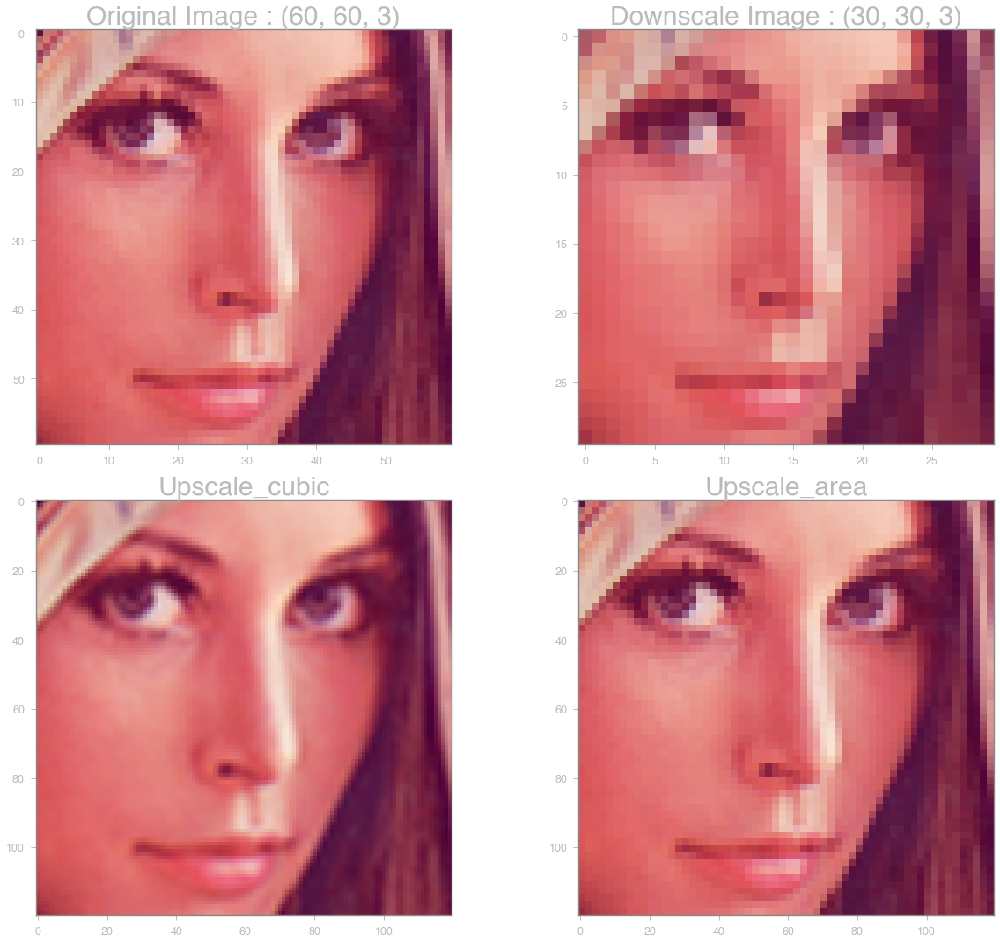

In [10]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

# img = cv2.imread("lenna.jpg", cv2.IMREAD_COLOR)
img = mpimg.imread('lenna.jpg')
h, w, d = img.shape
dims = (w//2, h//2)
dims_ = (w*2, h*2)
downscale = cv2.resize(img, dims, interpolation=cv2.INTER_AREA)
upscale = cv2.resize(img, dims_, interpolation=cv2.INTER_CUBIC)
upscale_ = cv2.resize(img, dims_, interpolation=cv2.INTER_AREA)

img = img[100:160, 100:160]
downscale = downscale[50:80, 50:80]
upscale = upscale[200:320, 200:320]
upscale_ = upscale_[200:320, 200:320]

imShow([img, downscale, upscale, upscale_], [f'Original Image : {img.shape}', f'Downscale Image : {downscale.shape}', f'Upscale_cubic', f'Upscale_area'])
# cv2.namedWindow('Original Image', cv2.WINDOW_NORMAL)
# cv2.imshow('Original Image', img)
# cv2.namedWindow('Downscale Image', cv2.WINDOW_NORMAL)
# cv2.imshow('Downscale Image', downscale)
# cv2.namedWindow('Upscale Inter_AREA Image', cv2.WINDOW_NORMAL)
# cv2.imshow('Upscale Inter_AREA Image', upscale)
# cv2.namedWindow('Upscalle Inter_CUBIC Image', cv2.WINDOW_NORMAL)
# cv2.imshow('Upscalle Inter_CUBIC Image', upscale_)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

(445, 1024) (445, 1024, 3)


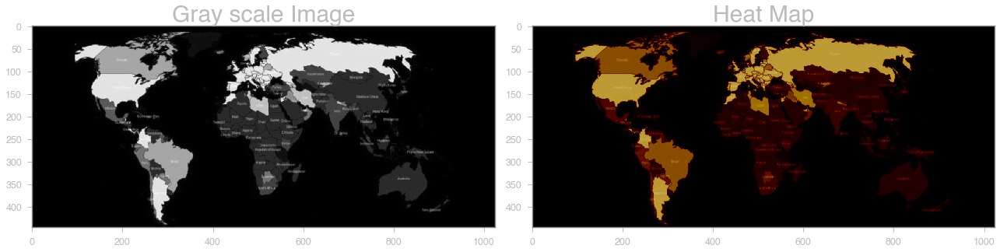

In [11]:
# Grayscale to heatmap
img = mpimg.imread('corona_gray.jpg')
heatmap = cv2.applyColorMap(img, cv2.COLORMAP_OCEAN)
print(img.shape, heatmap.shape)
imShow([img, heatmap], ['Gray scale Image', 'Heat Map'])
# imShow([heatmap])

<a id='image_enhancing'></a>
### Image Enhancing

- [X] Negative
- [X] Log Transform, Gamma Transform

<br>

-----
##### P.S Here, We show with just gray scale, But you can always try with all 3 Color spaces and stack them later with 
> np.dstack((r, g, b))

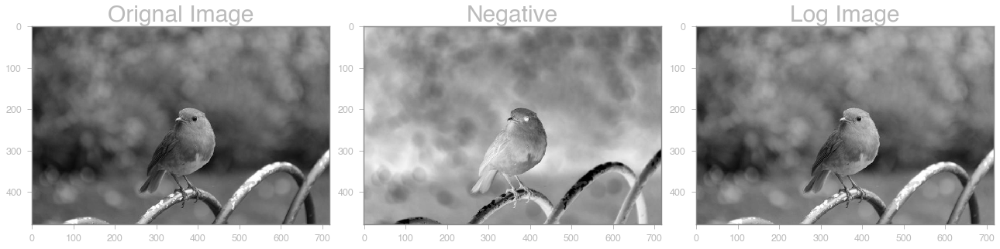

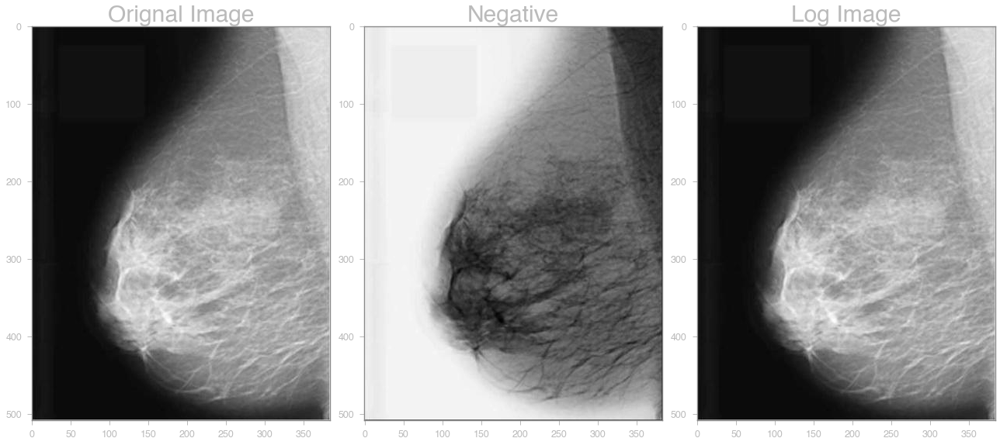

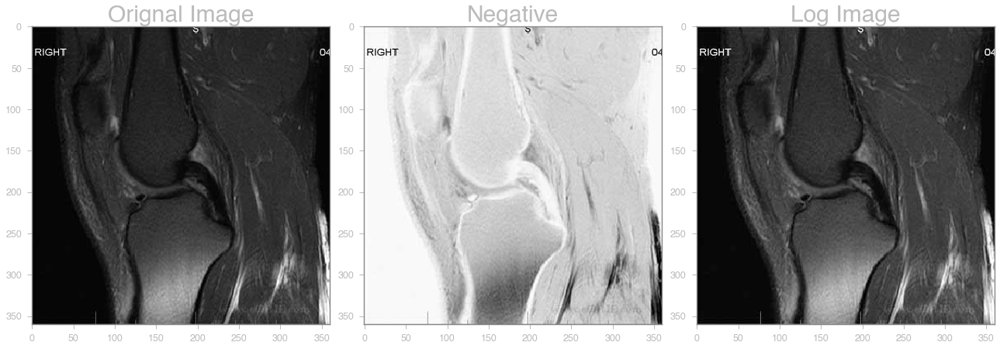

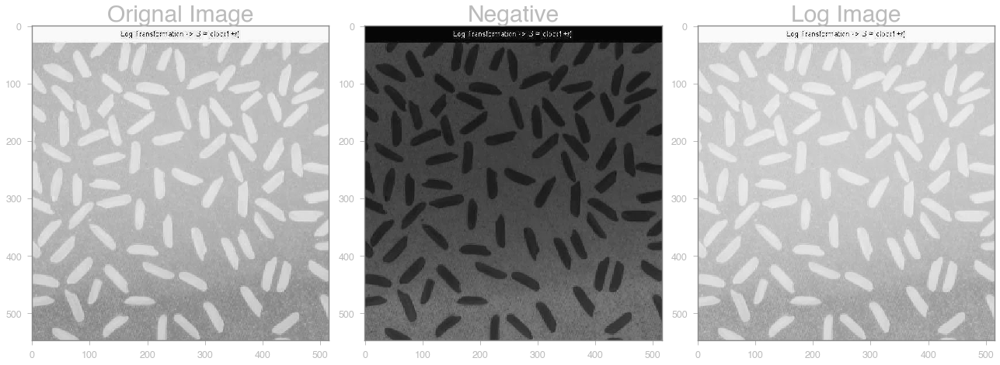

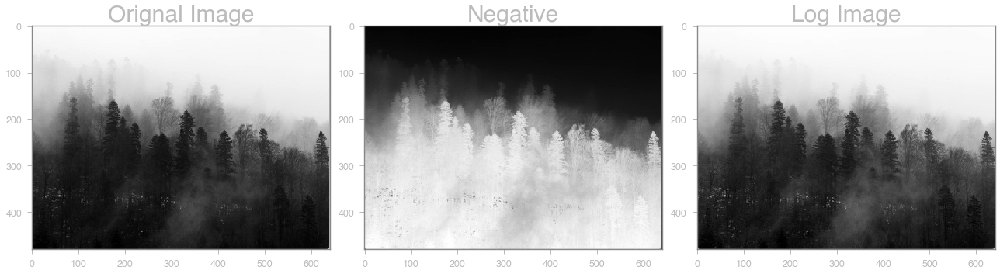

In [14]:
img_names = ['bird.jpg', 'F3.png', 'PCL.jpg', 'cells.jpg', 'tree.jpg']

for img_name in img_names:
    img = mpimg.imread(img_name)
    if img.ndim==3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    negative = 255-img
    img_copy = np.copy(img).astype(np.float32)
    img_copy /= 255
    log = np.log(1.0+img_copy)
    

#     imShow([img, negative, log], ['Orignal Image', 'Negative Image', 'Log Image'])
    imShow([img, negative, log], ['Orignal Image', 'Negative', 'Log Image'])

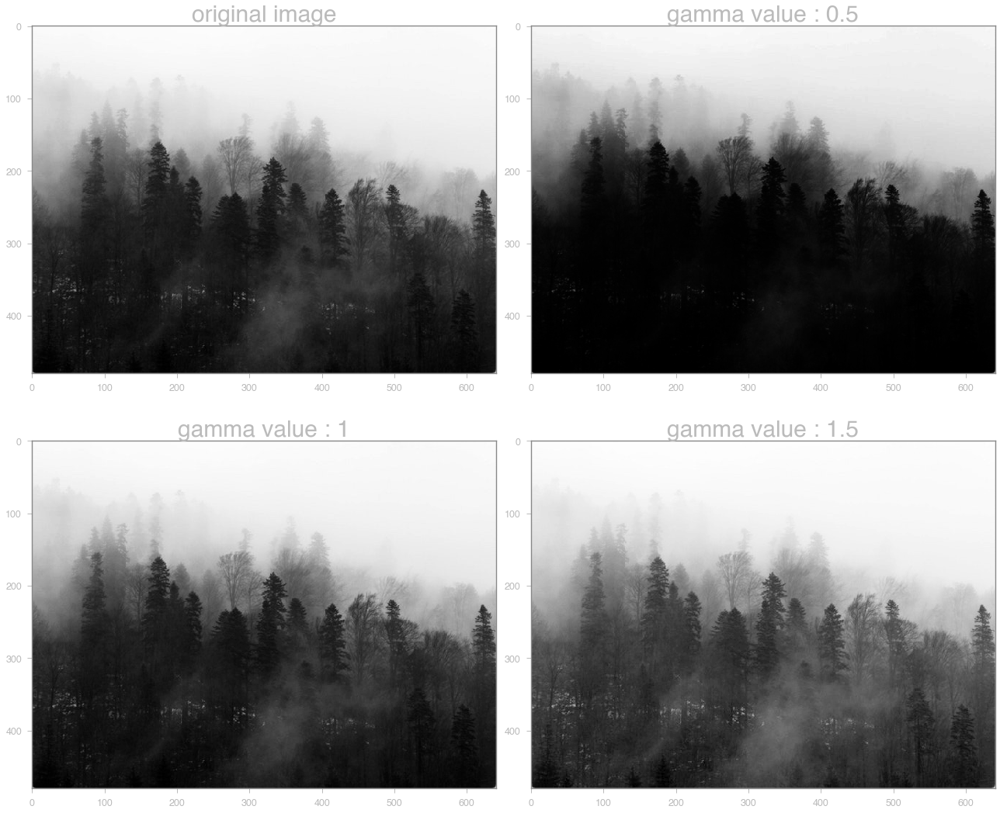

In [15]:
gamma0 = 0.5
gamma1 = 1
gamma2 = 1.5

img = mpimg.imread('tree.jpg')
if img.ndim>=3:
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
r0 = 1/gamma0
result0 = (img/255)**r0
r1 = 1/gamma1
result1 = (img/255)**r1
r2 = 1/gamma2
result2 = (img/255)**r2

imShow([img, result0, result1, result2], 
       ['original image', f'gamma value : {gamma0}', 
       f'gamma value : {gamma1}', f'gamma value : {gamma2}'])

In [20]:
from ipywidgets import interact

@interact(gamma=(0.1, 3, 0.1))
def gamma_correction(gamma=1):
    img = mpimg.imread('tree.jpg')
    if img.ndim>=3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    r = 1/gamma
    result = (img/255)**r
    print("Gamma value : \t", gamma)
    imShow([img, result], ['Original image', 'Gamma Correction'])


interactive(children=(FloatSlider(value=1.0, description='gamma', max=3.0, min=0.1), Output()), _dom_classes=(…

<a id='image_gradient'></a>
### Image Gradient

#### Edge Detection

* Sobel edge (L1), Laplacian Edge (L2)
* Smooth, Sharpen Image

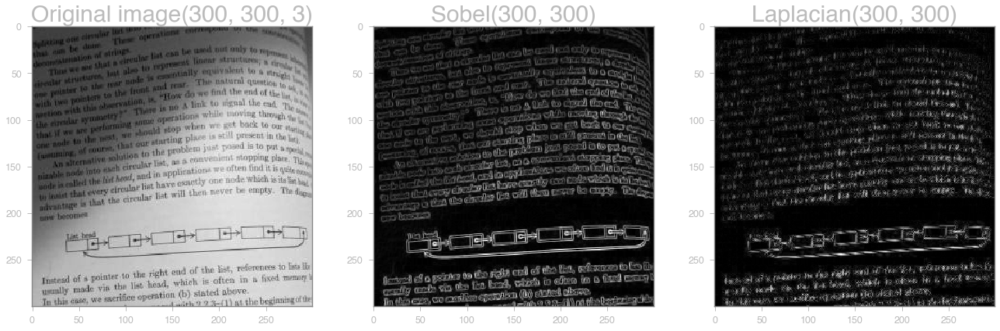

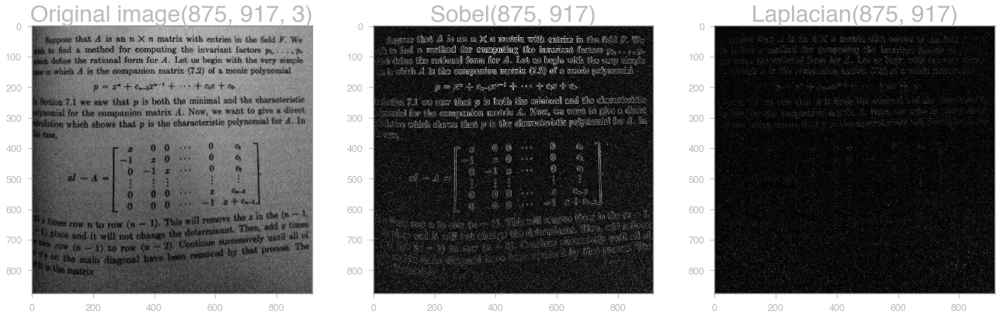

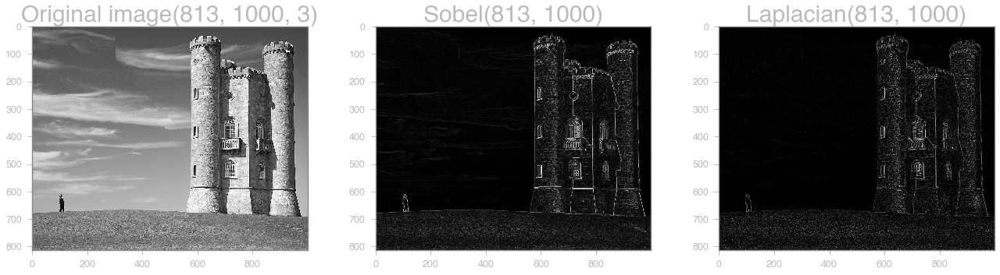

In [21]:
def sobelEdge(img):
    sobelx = np.abs(cv2.Sobel(img, 3, 0, 1)).astype(np.uint32)
    sobely = np.abs(cv2.Sobel(img, 3,1, 0)).astype(np.uint32)
    sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    sobel = (sobel/np.max(sobel)) * 255
    return sobel.astype(np.uint8)

def laplaceEdge(img):
    laplace = np.abs(cv2.Laplacian(img, cv2.CV_64F, ksize=3))
    laplace = ((laplace/np.max(laplace)) * 255).astype(np.uint8)
    return laplace
    
img_names = ['dark.jpg', 'page.jpg','tower.jpg']
for img_name in img_names:
    img = mpimg.imread(img_name)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobel = sobelEdge(gray)
    laplace = laplaceEdge(gray)
    imShow([gray, sobel, laplace], [f'Original image{img.shape}', f'Sobel{sobel.shape}', f'Laplacian{laplace.shape}'])

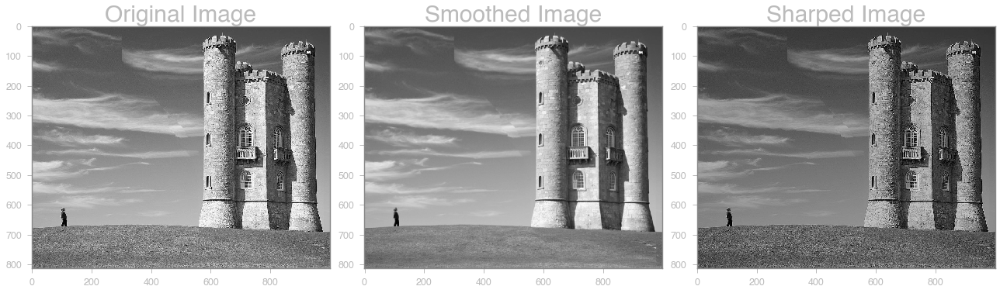

In [22]:
def smooth(img):
    blurred = cv2.GaussianBlur(img, (9,9), 1)
    return blurred

def sharp(img):
    blurred = cv2.GaussianBlur(img, (5, 5), 1).astype(np.float32)
    img = img.astype(np.float32)
    result = np.abs((1.5*img) - (0.5*blurred))
    result = ((result/np.max(result)) * 255).astype(np.uint8)
    return result

blurred = smooth(gray)
sharped = sharp(gray)
imShow([gray, blurred, sharped], ['Original Image', 'Smoothed Image', 'Sharped Image'])

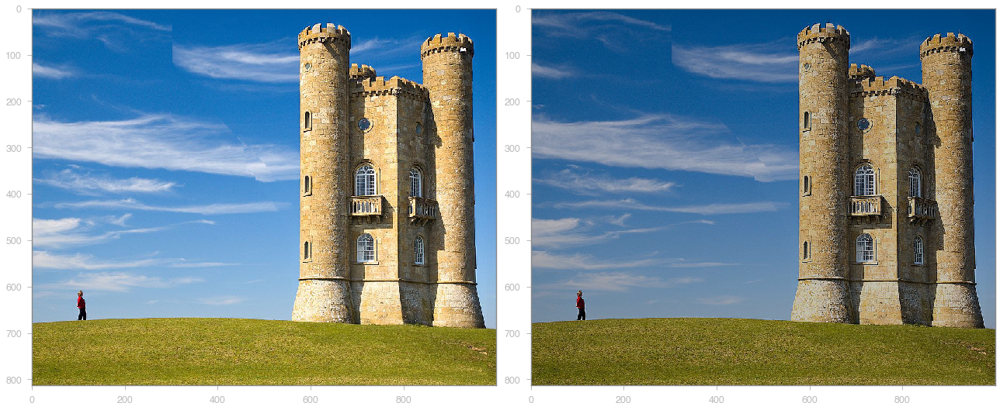

In [23]:
# Sharpening in color image
img = mpimg.imread('tower.jpg')
h, w, d = img.shape
result = np.zeros((h, w, d), dtype=np.uint8)
for i in range(3):
    gray = img[:, :, i]
    sharped = sharp(gray)
    result[:, :, i] = sharped

imShow([img, result])

<a id='image_segmentation'></a>
### Image Segmentation

- Image Thresholding
    - difference between 0-1 and 0-255

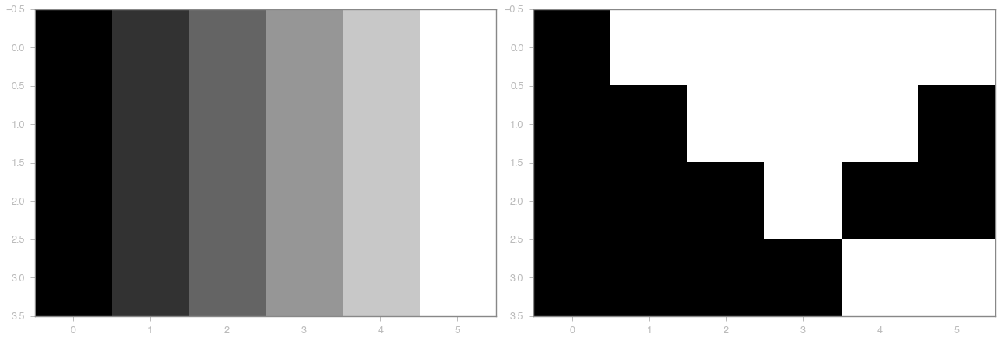

In [24]:
# Gray Scale Image
img1 = np.array([[0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255]])
# Binary Image
img2 = np.array([[0, 1, 1, 1, 1, 1],
                [0, 0, 1, 1, 1, 0],
                [0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 1, 1]])

# threshold_img = np.zeros_like(img1)
# threshold_img[img1>150] = 1

imShow([img1, img2])

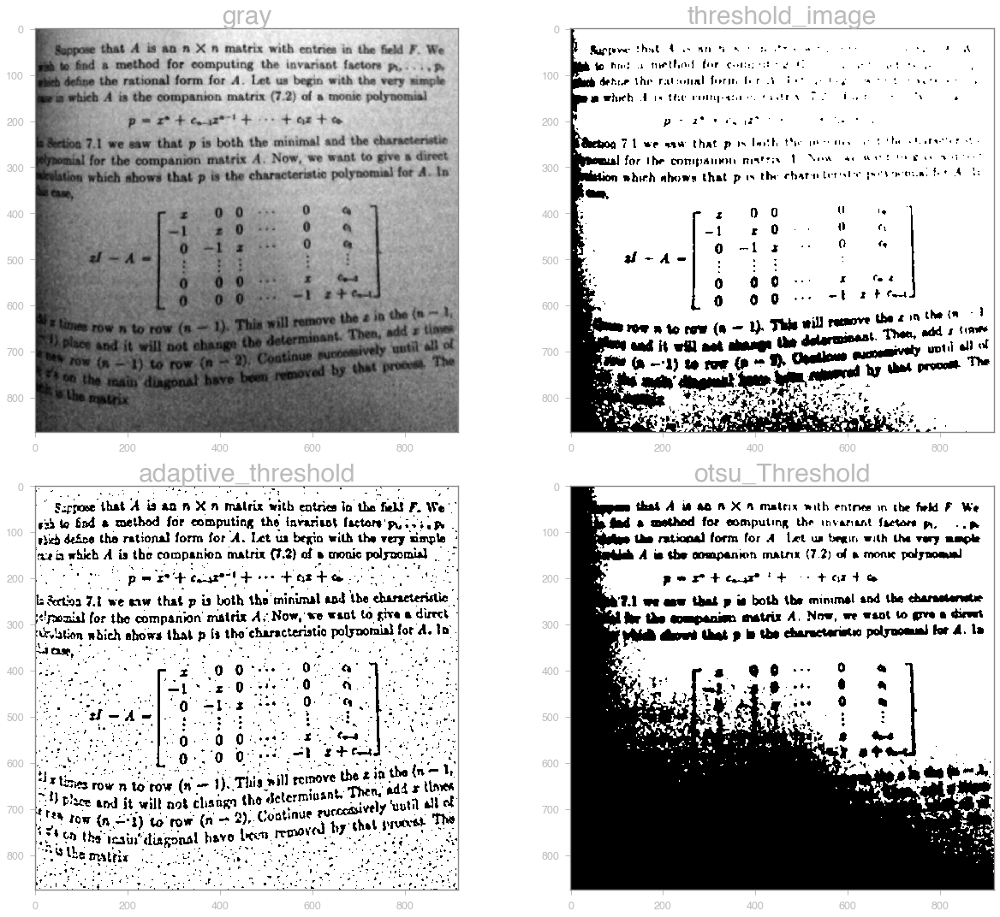

In [25]:
# Global Threshold
img = mpimg.imread('page.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # 0 ~ 255
# gray = cv2.GaussianBlur(gray, (5,5), 1)
gray = cv2.medianBlur(gray, 5)
glob_thresh = np.ones_like(gray)
glob_thresh[gray<25] = 0  # 0 & 1

# adap_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
#                                    cv2.THRESH_BINARY, 11, 2)
adap_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY, 15, 3)

_, otsu_thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

imShow([gray, glob_thresh, adap_thresh, otsu_thresh],
       ['gray', 'threshold_image', 'adaptive_threshold', 'otsu_Threshold'])

Since thresholding process is transforming gray scale image to **Binary one**, it is also called binarization.
> Different method for thresholding would be useful in different scenerios.<br>The best way to find the best method is by trial and error.

<a id='morphological'></a>
### [Morphological Transformations](https://docs.opencv.org/master/d9/d61/tutorial_py_morphological_ops.html)

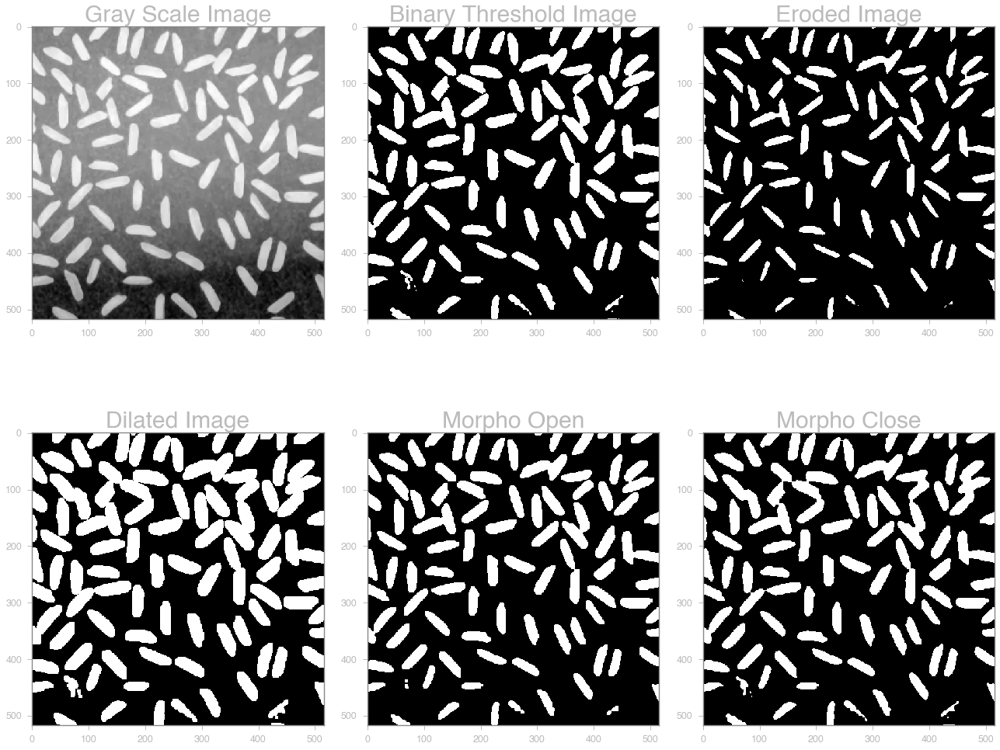

In [26]:
img = mpimg.imread('cells.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray = cv2.medianBlur(gray, 5)
gray = gray[30:, :]

# Let's do some thresholding
thresh = np.zeros_like(gray)
# threshold value here get by trial and error
thresh[gray>175] = 1


kernel = np.ones((5,5), np.uint8)
#Erosion
eroded = cv2.erode(thresh, kernel, iterations=1)
#Dilation
dilated = cv2.dilate(thresh, kernel, iterations=1)

# Opening (Erosion + Dilation)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
# Closing (Dilation + Erosion)
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
imShow([gray, thresh, eroded, dilated, opening, closing],
       ['Gray Scale Image', 'Binary Threshold Image', 'Eroded Image',
        'Dilated Image', 'Morpho Open', 'Morpho Close'])

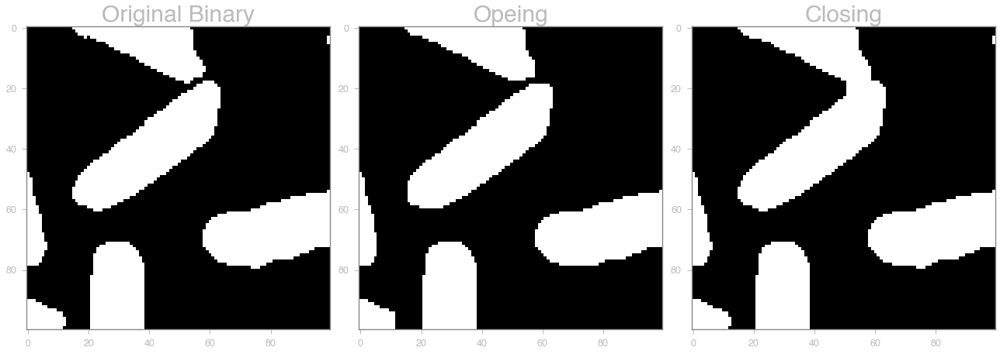

In [27]:
#collapse-hide
thresh_ = thresh[100:200, 150:250]
open_ = opening[100:200, 150:250]
close_ = closing[100:200, 150:250]
imShow([thresh_, open_, close_],
       ['Original Binary', 'Opeing', 'Closing'])

In [28]:
from ipywidgets import interact
# Let's play around
def basicMorph(kernel_size=3, iterations=1):
    print(f'Kernel Size : \t{kernel_size}\nIterations : \t{iterations}')
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    erode = cv2.erode(thresh, kernel, iterations=iterations)
    dilate = cv2.dilate(thresh, kernel, iterations=iterations)
    imShow([thresh, erode, dilate],
           ['Input Image', 'Eroded image', 'Dilated Image'])


interact(basicMorph, kernel_size=(1, 9, 2), iterations=(1, 5, 1));

interactive(children=(IntSlider(value=3, description='kernel_size', max=9, min=1, step=2), IntSlider(value=1, …

In [ ]:
import cv2

img = cv2.imread('tower.jpg')
cv2.namedWindow("Image", cv2.WINDOW_NORMAL)
cv2.imshow("Image",img)
cv2.waitKey(0)
cv2.destroyAllWindows()